# Setup

In [114]:
import pandas as pd
import seaborn as sns
import numpy as np

# Preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler

# Something
from sklearn.neighbors import NearestNeighbors

# Dimensionality Reduction
from sklearn.decomposition import PCA

# Clustering
from sklearn.cluster import DBSCAN

# Validation
from sklearn.metrics import silhouette_score

# Visualization
import matplotlib.pyplot as plt
import umap

from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10
output_notebook()

Loading BokehJS ...

## Load data

In [118]:
X_train = pd.read_csv("./Dataset/train.csv")
X_test = pd.read_csv("./Dataset/test.csv")

In [119]:
X_train.head()

,Employee ID,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,...,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
0,8410,31,Male,19,Education,5390,Excellent,Medium,Average,2,...,0,Mid,Medium,89,No,No,No,Excellent,Medium,Stayed
1,64756,59,Female,4,Media,5534,Poor,High,Low,3,...,3,Mid,Medium,21,No,No,No,Fair,Low,Stayed
2,30257,24,Female,10,Healthcare,8159,Good,High,Low,0,...,3,Mid,Medium,74,No,No,No,Poor,Low,Stayed
3,65791,36,Female,7,Education,3989,Good,High,High,1,...,2,Mid,Small,50,Yes,No,No,Good,Medium,Stayed
4,65026,56,Male,41,Education,4821,Fair,Very High,Average,0,...,0,Senior,Medium,68,No,No,No,Fair,Medium,Stayed


# Preprocessing Data

Removal of columns that are not needed. Employee ID does not affect the clustering of the data.

In [120]:
def remove_columns(dataframe, labels):
    return dataframe.drop(labels=labels, axis=1)

X_train = remove_columns(X_train, ["Employee ID"])
X_test = remove_columns(X_test, ["Employee ID"])

In [121]:
X_train = remove_columns(X_train, ["Job Role", "Marital Status", "Leadership Opportunities", "Remote Work"])
X_test = remove_columns(X_test, ["Job Role", "Marital Status", "Leadership Opportunities", "Remote Work"])

## Convert Categorical Data to Numerical Data

In [122]:
numericVariables = ['Age', 'Years at Company', 'Monthly Income', 'Number of Promotions', 'Distance from Home', 'Number of Dependents', 'Company Tenure']
ordinalVariables = ['Work-Life Balance', 'Job Satisfaction', 'Performance Rating', 'Education Level', 'Job Level', 'Company Size', 'Company Reputation', 'Employee Recognition']
norminalVariables = ['Gender', 'Job Role', 'Overtime', 'Marital Status', 'Remote Work', 'Leadership Opportunities', 'Innovation Opportunities', 'Attrition']

### Norminal Variables

In [123]:
# Create the encoder.
norminalEncoder = OneHotEncoder(handle_unknown="ignore")

In [124]:
def get_norminal_dataframe(norminalEncoder, norminalVariables, dataframe):
    norminalEncoder.fit(dataframe[dataframe.columns.intersection(norminalVariables)])    # Assume for simplicity all features are categorical.
    norminal_encoded = norminalEncoder.transform(dataframe[dataframe.columns.intersection(norminalVariables)]).todense()
    norminal_df = pd.DataFrame(norminal_encoded, columns=norminalEncoder.get_feature_names_out())
    return norminal_df

norminal_df = get_norminal_dataframe(norminalEncoder, norminalVariables, X_train)
norminal_df.head()

,Gender_Female,Gender_Male,Overtime_No,Overtime_Yes,Innovation Opportunities_No,Innovation Opportunities_Yes,Attrition_Left,Attrition_Stayed
0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
4,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0


### Ordinal Variables

In [125]:
for x in X_train[ordinalVariables]:
     print(X_train[ordinalVariables][x].unique())

['Excellent' 'Poor' 'Good' 'Fair']
['Medium' 'High' 'Very High' 'Low']
['Average' 'Low' 'High' 'Below Average']
['Associate Degree' 'Master’s Degree' 'Bachelor’s Degree' 'High School'
 'PhD']
['Mid' 'Senior' 'Entry']
['Medium' 'Small' 'Large']
['Excellent' 'Fair' 'Poor' 'Good']
['Medium' 'Low' 'High' 'Very High']


In [126]:
ordinalEncoder = OrdinalEncoder(categories=[
    ['Poor', 'Fair', 'Good', 'Excellent'],
    ['Low', 'Medium', 'High', 'Very High'],
    ['Low', 'Below Average', 'Average', 'High'],
    ['High School', 'Associate Degree', 'Bachelor’s Degree', 'Master’s Degree',
    'PhD'],
    ['Entry', 'Mid', 'Senior'],
    ['Small', 'Medium', 'Large'],
    ['Poor', 'Fair', 'Good', 'Excellent'],
    ['Low', 'Medium', 'High', 'Very High']
                                            ])

In [127]:
def get_ordinal_dataframe(ordinalEncoder, ordinalVariables, dataframe):
    ordinalEncoder.fit(dataframe[dataframe.columns.intersection(ordinalVariables)])
    ordinalEncoded = ordinalEncoder.transform(dataframe[dataframe.columns.intersection(ordinalVariables)])
    ordinal_df = pd.DataFrame(ordinalEncoded, columns=ordinalEncoder.get_feature_names_out())
    return ordinal_df
ordinal_df = get_ordinal_dataframe(ordinalEncoder, ordinalVariables, X_train)
ordinal_df.head()

,Work-Life Balance,Job Satisfaction,Performance Rating,Education Level,Job Level,Company Size,Company Reputation,Employee Recognition
0,3.0,1.0,2.0,1.0,1.0,1.0,3.0,1.0
1,0.0,2.0,0.0,3.0,1.0,1.0,1.0,0.0
2,2.0,2.0,0.0,2.0,1.0,1.0,0.0,0.0
3,2.0,2.0,3.0,0.0,1.0,0.0,2.0,1.0
4,1.0,3.0,2.0,0.0,2.0,1.0,1.0,1.0


### Merging of Datasets

In [128]:
numeric_df = X_train[X_train.columns.intersection(numericVariables)]
merged_df = pd.concat([numeric_df.reset_index(drop=True), norminal_df.reset_index(drop=True), ordinal_df.reset_index(drop=True)], axis=1)
merged_df.head()

,Age,Years at Company,Monthly Income,Number of Promotions,Distance from Home,Number of Dependents,Company Tenure,Gender_Female,Gender_Male,Overtime_No,...,Attrition_Left,Attrition_Stayed,Work-Life Balance,Job Satisfaction,Performance Rating,Education Level,Job Level,Company Size,Company Reputation,Employee Recognition
0,31,19,5390,2,22,0,89,0.0,1.0,1.0,...,0.0,1.0,3.0,1.0,2.0,1.0,1.0,1.0,3.0,1.0
1,59,4,5534,3,21,3,21,1.0,0.0,1.0,...,0.0,1.0,0.0,2.0,0.0,3.0,1.0,1.0,1.0,0.0
2,24,10,8159,0,11,3,74,1.0,0.0,1.0,...,0.0,1.0,2.0,2.0,0.0,2.0,1.0,1.0,0.0,0.0
3,36,7,3989,1,27,2,50,1.0,0.0,1.0,...,0.0,1.0,2.0,2.0,3.0,0.0,1.0,0.0,2.0,1.0
4,56,41,4821,0,71,0,68,0.0,1.0,0.0,...,0.0,1.0,1.0,3.0,2.0,0.0,2.0,1.0,1.0,1.0


## Normalize Data

In [129]:
def normalize_data(dataframe):
    norm_merged_nparr = StandardScaler().fit_transform(dataframe)
    norm_merged_df = pd.DataFrame(data=norm_merged_nparr, columns=dataframe.columns)
    return norm_merged_df

norm_merged_df = normalize_data(merged_df)
norm_merged_df.head()

,Age,Years at Company,Monthly Income,Number of Promotions,Distance from Home,Number of Dependents,Company Tenure,Gender_Female,Gender_Male,Overtime_No,...,Attrition_Left,Attrition_Stayed,Work-Life Balance,Job Satisfaction,Performance Rating,Education Level,Job Level,Company Size,Company Reputation,Employee Recognition
0,-0.626336,0.288648,-0.888892,1.173308,-0.983891,-1.059395,1.308164,-0.905758,0.905758,0.69603,...,-0.952117,0.952117,1.495228,-0.926143,0.067311,-0.572439,0.266183,0.144123,1.624550,0.054571
1,1.691627,-1.045173,-0.821960,2.178351,-1.019020,0.869027,-1.367856,1.104048,-1.104048,0.69603,...,-0.952117,0.952117,-1.705081,0.221150,-2.641418,1.160008,0.266183,0.144123,-0.538975,-1.033892
2,-1.205827,-0.511645,0.398153,-0.836777,-1.370314,0.869027,0.717865,1.104048,-1.104048,0.69603,...,-0.952117,0.952117,0.428459,0.221150,-2.641418,0.293785,0.266183,0.144123,-1.620738,-1.033892
3,-0.212414,-0.778409,-1.540084,0.168266,-0.808244,0.226220,-0.226612,1.104048,-1.104048,0.69603,...,-0.952117,0.952117,0.428459,0.221150,1.421676,-1.438662,0.266183,-1.283410,0.542787,0.054571
4,1.443273,2.244918,-1.153366,-0.836777,0.737448,-1.059395,0.481746,-0.905758,0.905758,-1.43672,...,-0.952117,0.952117,-0.638311,1.368443,0.067311,-1.438662,1.600523,0.144123,-0.538975,0.054571


# Dimensionality Reduction

## Principle component analysis

Text(0, 0.5, 'cumulative explained variance')

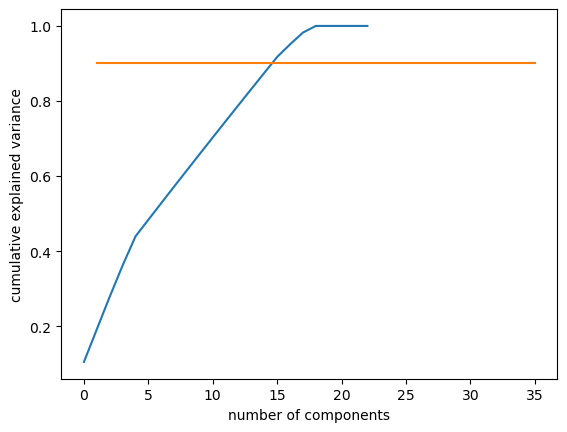

In [130]:
pca = PCA().fit(norm_merged_df)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.plot(list(range(1,36)), [0.9] * 35)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [131]:
pca = PCA(n_components=15)

In [132]:
def get_reduced_dataframe(pca, norm_merged_df):
    reduced_norm_merged_arr = pca.fit_transform(norm_merged_df)
    return reduced_norm_merged_arr

reduced_norm_merged_arr = get_reduced_dataframe(pca, norm_merged_df)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.10489085 0.08698321 0.08674835 0.08314633 0.07756041 0.04434032
 0.04424427 0.04416302 0.04376642 0.0436142  0.0435078  0.04325647
 0.04308679 0.04295521 0.04274624]
[379.18274794 345.30071454 344.83422597 337.59911058 326.06171654
 246.53532284 246.26817517 246.04194506 244.93466219 244.50835368
 244.20992314 243.50354771 243.02548485 242.65413193 242.06316139]


In [133]:
reduced_norm_merged_arr[0]

array([-2.33117704, -0.9592692 , -0.01943987, -0.23499236,  0.21326513,
        0.40688535, -0.18236617, -0.06146761, -1.35195848, -1.2665751 ,
       -0.47982755, -0.97637261,  0.56517106,  0.22355061,  1.48177973])

# KNN Distance Plot

In [134]:
nbrs = NearestNeighbors(n_neighbors=16, algorithm='ball_tree').fit(reduced_norm_merged_arr)

In [135]:
def get_distances(nbrs, dataframe):
    distances, indices = nbrs.kneighbors(reduced_norm_merged_arr)
    return distances

In [136]:
distances = get_distances(nbrs, reduced_norm_merged_arr)

In [137]:
distances

array([[0.        , 1.63958354, 1.69834347, ..., 2.08117011, 2.09160198,
        2.11228206],
       [0.        , 1.90354832, 2.41889394, ..., 3.10809115, 3.11251928,
        3.11983588],
       [0.        , 1.74559164, 2.07023914, ..., 2.45244461, 2.46975492,
        2.47039802],
       ...,
       [0.        , 1.71650046, 1.8695553 , ..., 2.34545016, 2.3464708 ,
        2.37324312],
       [0.        , 1.34080093, 1.69154211, ..., 2.31894301, 2.37141432,
        2.37391111],
       [0.        , 1.46485675, 1.71756371, ..., 2.10093553, 2.10395932,
        2.11146581]])

In [138]:
new_distances = np.sort(distances[:,1], axis=0)
new_distances = [i * 1 for i in new_distances]

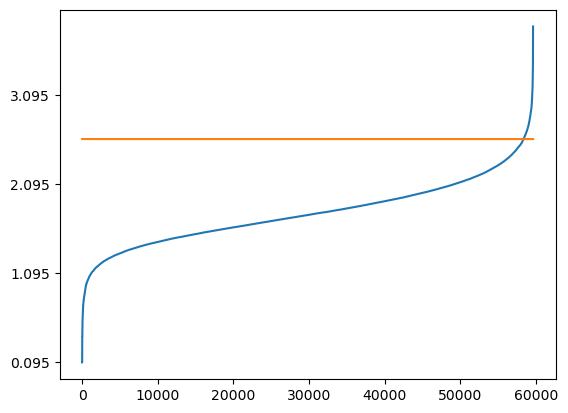

In [157]:
plt.plot(list(range(1,len(new_distances)+1)), new_distances)
plt.plot(list(range(1,len(new_distances)+1)), len(new_distances)*[2.6])
plt.yticks(np.arange(min(new_distances), max(new_distances), 1))
plt.show()

# Determining minimum Points for Core Node

In [161]:
minPts = 2 * len(reduced_norm_merged_arr[0]) - 10

# DBScan

In [162]:
dbsScan = DBSCAN(eps = 2.6, min_samples=minPts)
clustering = dbsScan.fit(reduced_norm_merged_arr)

In [163]:
labels = clustering.labels_
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 8
Estimated number of noise points: 4268


# Validation

In [164]:
silhouette_score(reduced_norm_merged_arr, dbsScan.fit_predict(reduced_norm_merged_arr))

0.10411319336940236

# Visualization

In [152]:
umapReducer = umap.UMAP()#random_state=42)

In [153]:
def get_UMAP_embedding(umap, dataframe):
    umap.fit(dataframe)
    embedding = umap.transform(dataframe)
    # Verify that the result of calling transform is
    # idenitical to accessing the embedding_ attribute
    assert(np.all(embedding == umap.embedding_))
    return embedding

umap_embedding = get_UMAP_embedding(umapReducer, norm_merged_df)

In [154]:
def displayUMAP(embedding, dataframe):
    embedding_df = pd.DataFrame(embedding, columns=('x', 'y'))
    for column in dataframe.columns:
        embedding_df[column.replace(" ", "").replace("-", "")] = [str(x) for x in dataframe[column]]

    datasource = ColumnDataSource(embedding_df)
    color_mapping = CategoricalColorMapper(factors=dataframe["Attrition"].unique(), palette=["Blue", "Red"])

    plot_figure = figure(
        title=f'UMAP projection of the Attrition dataset',
        width=1000,
        height=1000,
        tools=('pan, wheel_zoom, reset')
    )

    tooltip = """"""
    for column in dataframe.columns:
        tooltip += f"""<div>
            <span style='font-size: 10px; color: #224450'>{column}:</span>
            <span style='font-size: 10px'>@{column.replace(" ", "").replace("-", "")}</span>
        </div>"""

    plot_figure.add_tools(HoverTool(tooltips=f"""
    <div>
        {tooltip}
    </div>
    """))

    plot_figure.circle(
        'x',
        'y',
        source=datasource,
        color=dict(field='Attrition', transform=color_mapping),
        line_alpha=0.6,
        fill_alpha=0.6,
        size=4
    )
    show(plot_figure)

In [155]:
displayUMAP(umap_embedding, X_train)